<a href="https://colab.research.google.com/github/Kwonyuna/2023_Project/blob/main/(LEARN)SmartFarm_TEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm

import seaborn as sns

import numpy as np
import pandas as pd
import math
import os
import glob


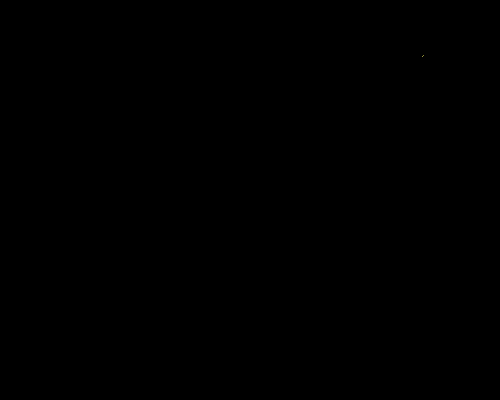

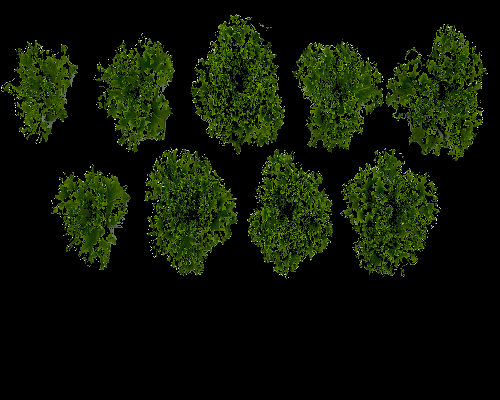

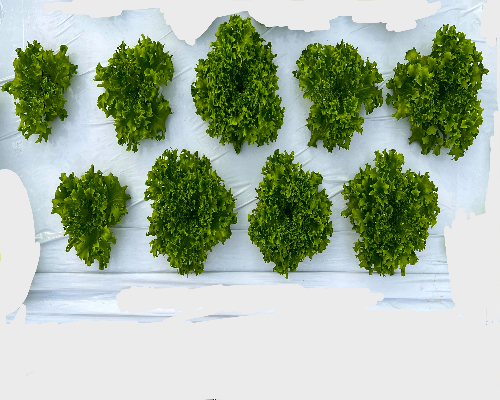

In [ ]:
resize = cv.resize(cv.imread('/content/drive/MyDrive/TEST_DATA/CASE2/image/IMG_2931.jpg'),(500 , 400)) # 경로
resize=cv.cvtColor(resize,cv.COLOR_BGR2HSV)
original=cv.cvtColor(resize,cv.COLOR_HSV2BGR)

#hsv로 색 추출
green_Lower=np.array([38,40,40])
green_Upper=np.array([80,255,255])

red_Lower=np.array([0,40,40])
red_Upper=np.array([30,255,255])

# mask
img_mask_green=cv.inRange(resize,green_Lower,green_Upper)
result_green=cv.bitwise_and(original,original,mask=img_mask_green)

img_mask_red=cv.inRange(resize,red_Lower,red_Upper)
result_red=cv.bitwise_and(original,original,mask=img_mask_red)

#show
cv2_imshow(result_red)
cv2_imshow(result_green)
cv2_imshow(original)


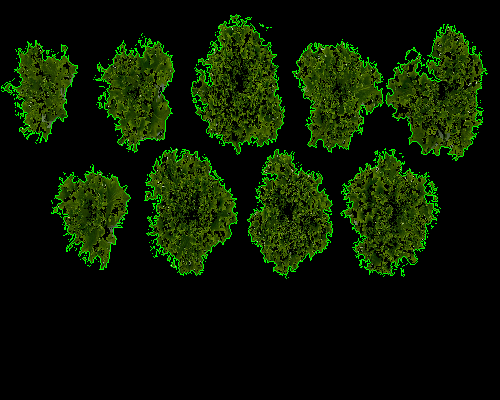

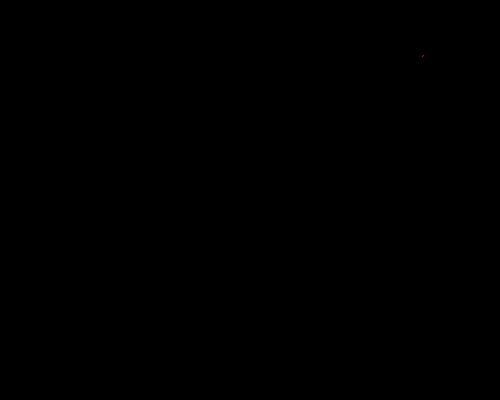

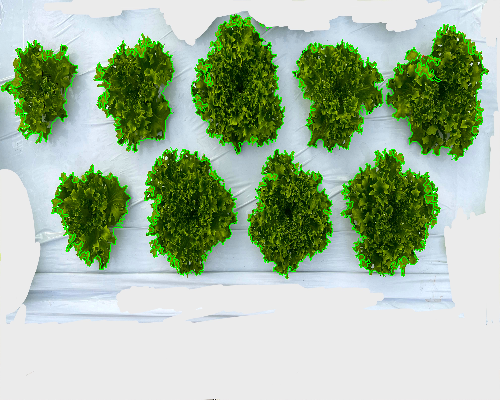

In [ ]:
# contour_green
contours_green, _ = cv.findContours(img_mask_green, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(original, contours_green, -1, (0, 255, 0), 1)
cv.drawContours(result_green, contours_green, -1, (0, 255, 0), 1)

# contour_red
contours_red, _ = cv.findContours(img_mask_red, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(original, contours_red, -1, (0, 0, 255), 1)
cv.drawContours(result_red, contours_red, -1, (0, 0, 255), 1)

cv2_imshow(result_green)
cv2_imshow(result_red)
cv2_imshow(original)

In [ ]:
dfs_area=[]

for i in range(10):
    area_green_list=[]
    area_red_list=[]
    area_total_list=[]

    default_path = "/content/drive/MyDrive/TEST_DATA/CASE"+str(i+1)+"/" #경로

    folder_list = os.listdir(default_path)
    #print(folder_list)

    folder=[]
    folder = [file for file in folder_list if file.startswith('image')]
    #print(folder)

    image_path=default_path+folder[0]+"/"

    image_list = sorted(os.listdir(image_path))
    #print(image_list)

    for index , path in enumerate(image_list):
        real_path = ""
        real_path = image_path + path
        #청색 범위
        green_Lower=np.array([35,40,40])
        green_Upper=np.array([80,255,255])

        #적색 범위
        red_Lower=np.array([0,40,40])
        red_Upper=np.array([30,255,255])

        #path 가 있으면
        img = cv.imread(real_path)

        #BGR to HSV
        img_hsv= cv.cvtColor(img , cv.COLOR_BGR2HSV)
        # mask
        img_mask_green=cv.inRange(img_hsv,green_Lower,green_Upper)
        img_mask_red=cv.inRange(img_hsv,red_Lower,red_Upper)
        # contour
        contours_green, _ = cv.findContours(img_mask_green, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        contours_red, _ = cv.findContours(img_mask_red, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

        #contour_area green
        area_green=0
        for k in range(0,(len(contours_green))):
            area_green+=cv.contourArea(contours_green[k])
        area_green_list.append(area_green)

        #contour_area red
        area_red=0
        for k in range(0,(len(contours_red))):
            area_red+=cv.contourArea(contours_red[k])
        area_red_list.append(area_red)

        #total_area 전체면적
        total_area=area_green+area_red
        area_total_list.append(total_area)

    df_area = pd.DataFrame({'Green_Area':area_green_list, 'Red_Area':area_red_list, 'Total_Area':area_total_list })
    dfs_area.append(df_area)

In [ ]:
len(dfs_area)

5

<ipython-input-18-99806c81667d>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,2,i+1)


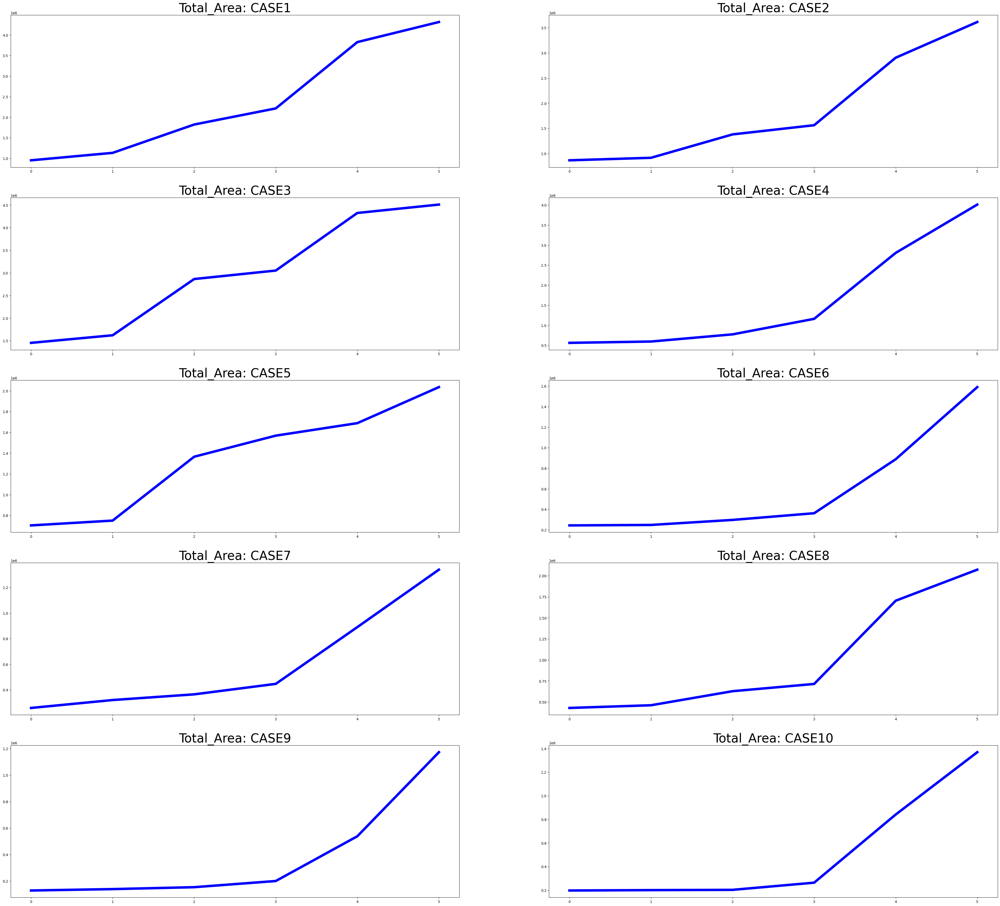

In [ ]:
f, axes = plt.subplots()
f.set_size_inches((50,45))

for i in range(len(dfs_area)):
    dfv=dfs_area[i]
    x=np.arange(len(dfv['Total_Area']))
    plt.subplot(5,2,i+1)
    plt.plot(x,dfv['Total_Area'], color='blue',linewidth=7.0)
    plt.title("Total_Area: CASE"+str(i+1),fontsize=35)


<ipython-input-4-14a3d36b318a>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,2,i+1)


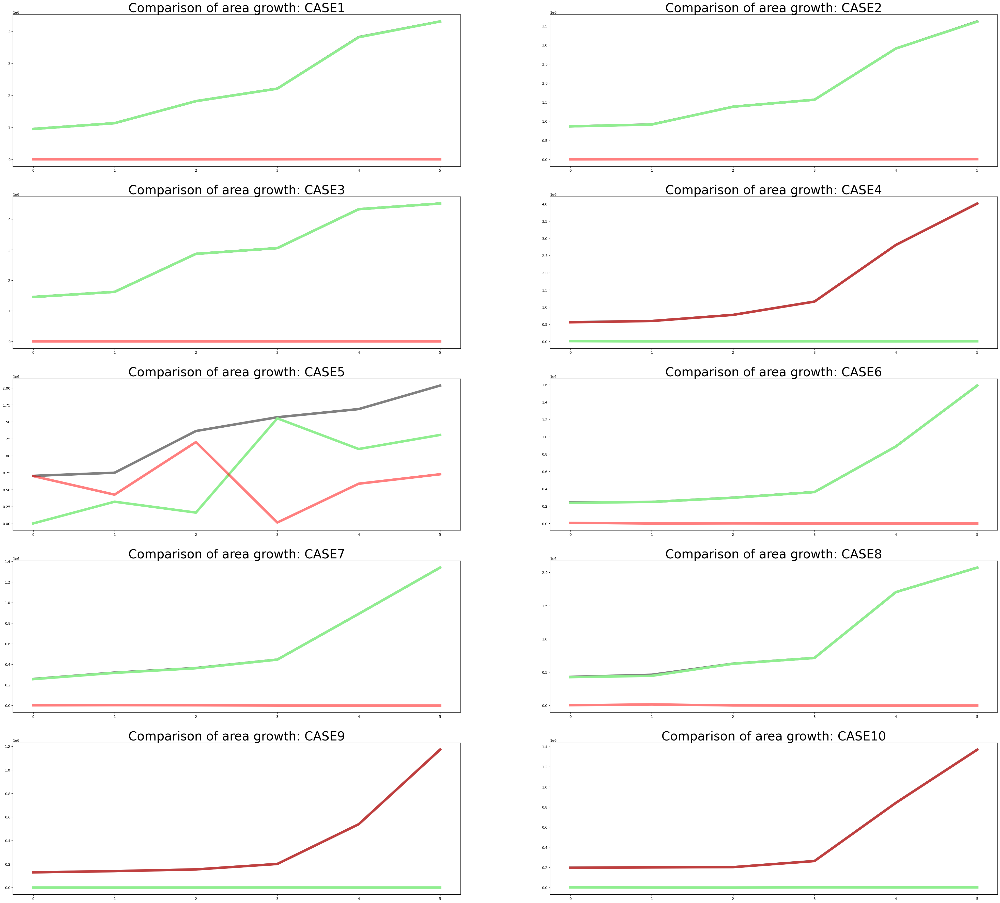

In [ ]:
f, axes = plt.subplots()
f.set_size_inches((50,45))

for i in range(len(dfs_area)):
    dfv=dfs_area[i]
    x=np.arange(len(dfv['Total_Area']))
    plt.subplot(5,2,i+1)
    plt.plot(x,dfv['Total_Area'], color='gray',linewidth=7.0)
    plt.plot(x,dfv['Green_Area'], color='lightgreen',linewidth=7.0)
    plt.plot(x,dfv['Red_Area'], color='red',alpha=0.5,linewidth=7.0)
    plt.title("Comparison of area growth: CASE"+str(i+1),fontsize=35)

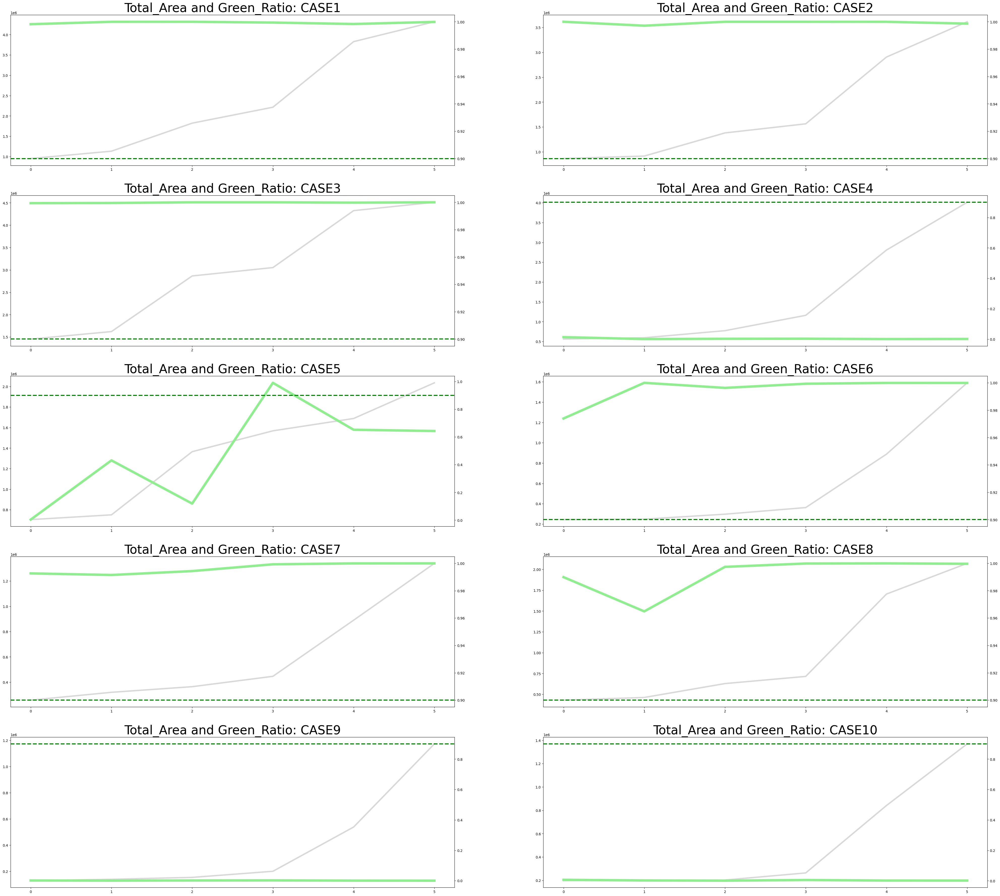

In [ ]:
for i in range(len(dfs_area)):
    dfs_area[i]['Green_Ratio']=dfs_area[i]['Green_Area']/dfs_area[i]['Total_Area']

fig = plt.figure()
fig.set_size_inches((50,45))

for i in range(len(dfs_area)):
    ax=fig.add_subplot(5,2, i+1)
    x=np.arange(len(dfs_area[i]['Total_Area']))
    ax.plot(x,dfs_area[i]['Total_Area'], color = 'gray', alpha = 0.3,linewidth=4.0)
    plt.title("Total_Area and Green_Ratio: CASE"+str(i+1),fontsize=35)
    # ax2는 y2에 대한 그래프, twinx로 x축을 공유
    ax2 = ax.twinx()
    ax2.plot(x, dfs_area[i]['Green_Ratio'], color = 'lightgreen',linewidth=7.0)
    ax2.axhline(0.9, 0, len(dfs_area[i]['Total_Area']), color='green', linestyle='--', linewidth=3) # 기준 0.9 표시

In [ ]:
for i in range(len(dfs_area)):
    dfs_area[i]['Green_Ratio']=dfs_area[i]['Green_Area']/dfs_area[i]['Total_Area']
    dfs_area[i]['case_idx']=i+1
    dfs_area[i]['img_idx']=range(len(dfs_area[i]))
df=pd.concat(dfs_area)

df=df.reset_index()
df

,index,Green_Area,Red_Area,Total_Area,Green_Ratio,case_idx,img_idx
0,0,950087.0,1692.5,951779.5,0.998222,1,0
1,1,1132768.5,31.5,1132800.0,0.999972,1,1
2,2,1822033.0,5.0,1822038.0,0.999997,1,2
3,3,2212801.5,1297.0,2214098.5,0.999414,1,3
4,4,3820935.5,6271.0,3827206.5,0.998361,1,4
5,5,4315370.5,527.5,4315898.0,0.999878,1,5
6,0,864998.5,0.0,864998.5,1.000000,2,0
7,1,912249.0,2632.0,914881.0,0.997123,2,1
8,2,1379951.0,0.0,1379951.0,1.000000,2,2
9,3,1562585.5,0.0,1562585.5,1.000000,2,3


In [ ]:
df2=df.loc[df['case_idx']<=5]

df2

,index,Green_Area,Red_Area,Total_Area,Green_Ratio,case_idx,img_idx
0,0,950087.0,1692.5,951779.5,0.998222,1,0
1,1,1132768.5,31.5,1132800.0,0.999972,1,1
2,2,1822033.0,5.0,1822038.0,0.999997,1,2
3,3,2212801.5,1297.0,2214098.5,0.999414,1,3
4,4,3820935.5,6271.0,3827206.5,0.998361,1,4
5,5,4315370.5,527.5,4315898.0,0.999878,1,5
6,0,864998.5,0.0,864998.5,1.000000,2,0
7,1,912249.0,2632.0,914881.0,0.997123,2,1
8,2,1379951.0,0.0,1379951.0,1.000000,2,2
9,3,1562585.5,0.0,1562585.5,1.000000,2,3


In [ ]:
df.to_excel('total.xlsx')

Text(0.5, 1.0, 'Total Area Distribution')

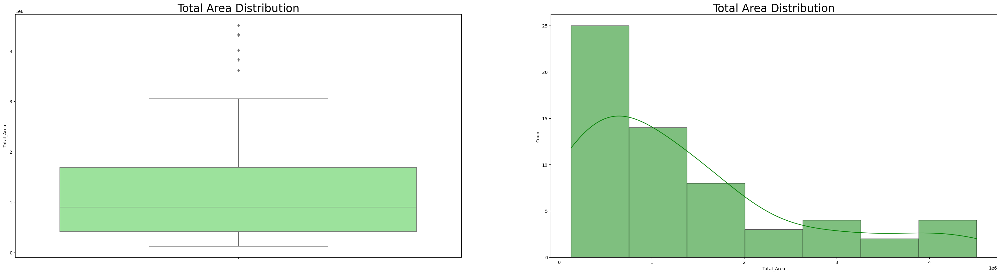

In [ ]:
# 분포
f, axes = plt.subplots(1, 2)
f.set_size_inches((40,10))

#전체 면적 boxplot
plt.subplot(1,2,1)
sns.boxplot(y = df["Total_Area"],color='lightgreen')
plt.title("Total Area Distribution",fontsize=25)

#전체 면적 분포곡선
plt.subplot(1,2,2)
sns.histplot(df["Total_Area"],color='green',kde=True)
plt.title("Total Area Distribution",fontsize=25)

Text(0.5, 1.0, 'Total Area Distribution')

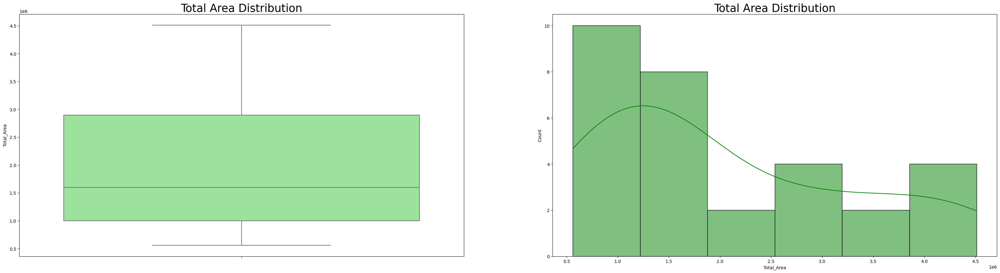

In [ ]:
# 분포
f, axes = plt.subplots(1, 2)
f.set_size_inches((40,10))

#전체 면적 boxplot
plt.subplot(1,2,1)
sns.boxplot(y = df2["Total_Area"],color='lightgreen')
plt.title("Total Area Distribution",fontsize=25)

#전체 면적 분포곡선
plt.subplot(1,2,2)
sns.histplot(df2["Total_Area"],color='green',kde=True)
plt.title("Total Area Distribution",fontsize=25)

전체면적 값의 분포에서 1과 2.5에 가까운 면적수치가 많아 0~1에 치우친 것을 확인할 수 있다.

큰 전체면적수치가 이상치로 많이 분류되었습니다.

# 이상치(이상점, outlier)란, 관측된 데이터의 범위에서 많이 벗어난 아주 작은 값이나 아주 큰 값을 말한다. 어떤 의사결정을 하는데 필요한 데이터를 분석할 경우 이렇게 이상한 값들에 의해서 의사결정에 영향을 미칠 수 있으므로 제거하는 것이 좋다.

<ipython-input-43-8305a6f5a9ad>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,2,i+1)


3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375
3610124.9375


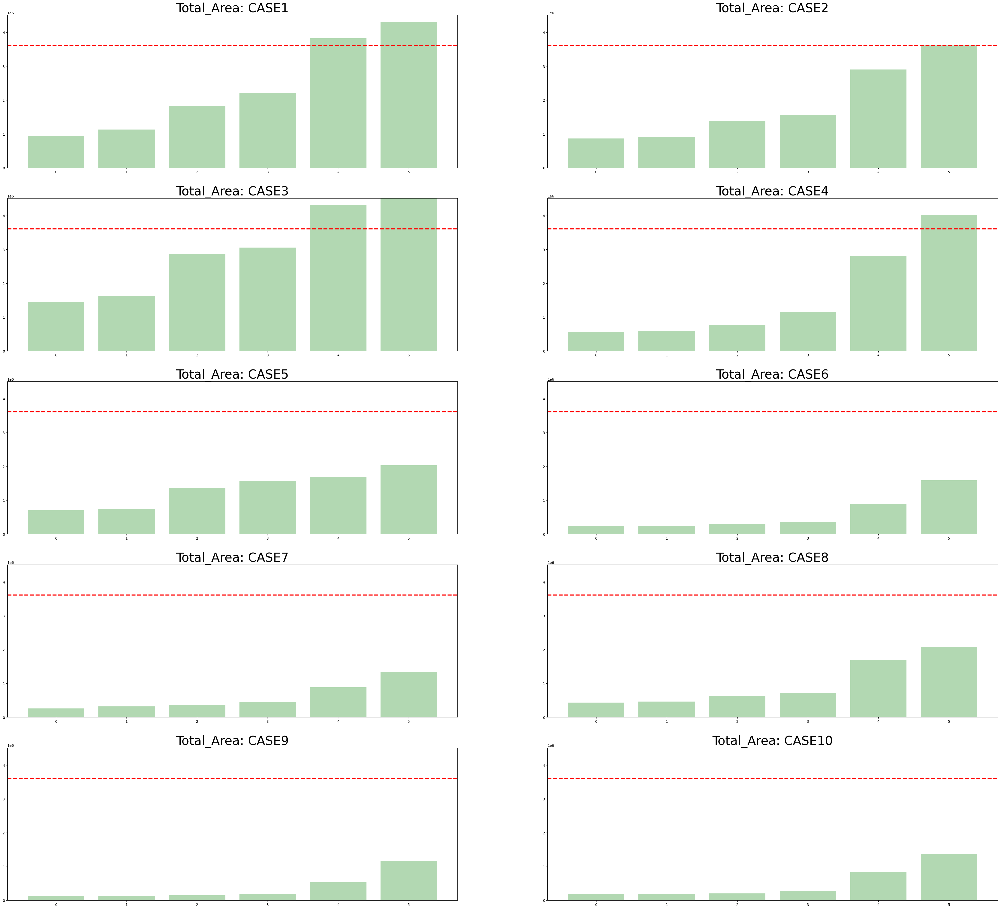

In [ ]:
IQR=df['Total_Area'].quantile(0.75)-df['Total_Area'].quantile(0.25)
max_except_outlier=(df["Total_Area"].quantile(0.75)+1.5*IQR)

# 사분위범위란 Q3(최소)-Q1구간(중앙)을 말하며, 이 구간에는 50%의 데이터들이 있음

f, axes = plt.subplots()
f.set_size_inches((50,45))


for i in range(len(dfs_area)):
    dfv=dfs_area[i]
    x=np.arange(len(dfv['Total_Area']))
    plt.subplot(5,2,i+1)
    plt.bar(x,dfv['Total_Area'], color='green',linewidth=7.0,alpha=0.3)
    plt.title("Total_Area: CASE"+str(i+1),fontsize=35)
    plt.axhline(max_except_outlier, 0, len(dfs_area[i]['Total_Area']), color='red', linestyle='--', linewidth=3)
    plt.ylim([0,max(df['Total_Area'])])

    print(max_except_outlier)

<ipython-input-34-3665cdc64e96>:43: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(math.ceil(len(outlier_img_list)/3), 3,outlier_img_list.index(path)+1)


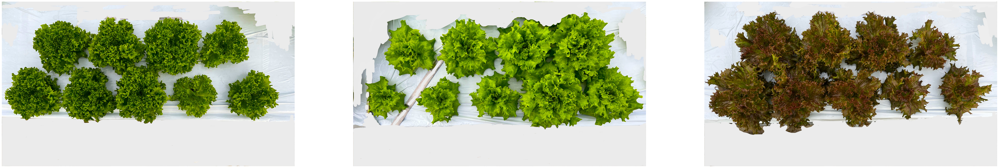

['/content/drive/MyDrive/TEST_DATA/CASE2/image/IMG_3239.jpg', '/content/drive/MyDrive/TEST_DATA/CASE1/image/IMG_2929.jpg', '/content/drive/MyDrive/TEST_DATA/CASE4/image/IMG_3241.jpg']


In [ ]:
# 기준 이상의 면적 데이터프레임 추축
area_outlier=df[df['Total_Area']>max_except_outlier]
area_outlier=area_outlier.sort_values(by=["Total_Area"], ascending=True)
area_outlier=area_outlier.head(3)

#이미지 경로 지정
outlier_img_list=[]
for i in area_outlier['case_idx'].unique():
    area_outlier_split=area_outlier[area_outlier['case_idx']==i]

    default_path = "/content/drive/MyDrive/TEST_DATA/CASE"+str(i)+"/" # 경로

    folder_list = os.listdir(default_path)
    #print(folder_list)

    folder=[]
    folder = [file for file in folder_list if file.startswith('image')]
    # print(folder)

    image_path=default_path+folder[0]+"/"

    image_list = sorted(os.listdir(image_path))
   # print(image_list)

    idx_max=area_outlier_split['img_idx'].max()
    idx_min=area_outlier_split['img_idx'].min()
    image_list=image_list[int(idx_min):int(idx_max)+1]

    for list_idx in range(len(image_list)):
        image_list[list_idx]=image_path+image_list[list_idx]
        #print(image_list)
    outlier_img_list.extend(image_list)

#outlier_img_list

#이미지 추출
f, axes = plt.subplots()
#f, axes = plt.subplots(math.ceil(len(outlier_img_list)/3), 3)
f.set_size_inches(70,40)

for path in outlier_img_list:

    plt.subplot(math.ceil(len(outlier_img_list)/3), 3,outlier_img_list.index(path)+1)

    img = cv.imread(path)
    img=cv.cvtColor(img,cv.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(img)
plt.show()
print(outlier_img_list)

**0.95로 검사사**


In [ ]:
df2=df.loc[df['case_idx']<=5]

df2

,index,Green_Area,Red_Area,Total_Area,Green_Ratio,case_idx,img_idx
0,0,950087.0,1692.5,951779.5,0.998222,1,0
1,1,1132768.5,31.5,1132800.0,0.999972,1,1
2,2,1822033.0,5.0,1822038.0,0.999997,1,2
3,3,2212801.5,1297.0,2214098.5,0.999414,1,3
4,4,3820935.5,6271.0,3827206.5,0.998361,1,4
5,5,4315370.5,527.5,4315898.0,0.999878,1,5
6,0,864998.5,0.0,864998.5,1.000000,2,0
7,1,912249.0,2632.0,914881.0,0.997123,2,1
8,2,1379951.0,0.0,1379951.0,1.000000,2,2
9,3,1562585.5,0.0,1562585.5,1.000000,2,3


In [ ]:
area_q95=df2['Total_Area'].quantile(0.95)

area_q95

4321356.2

<ipython-input-38-eb6340c27a52>:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,2,i+1)


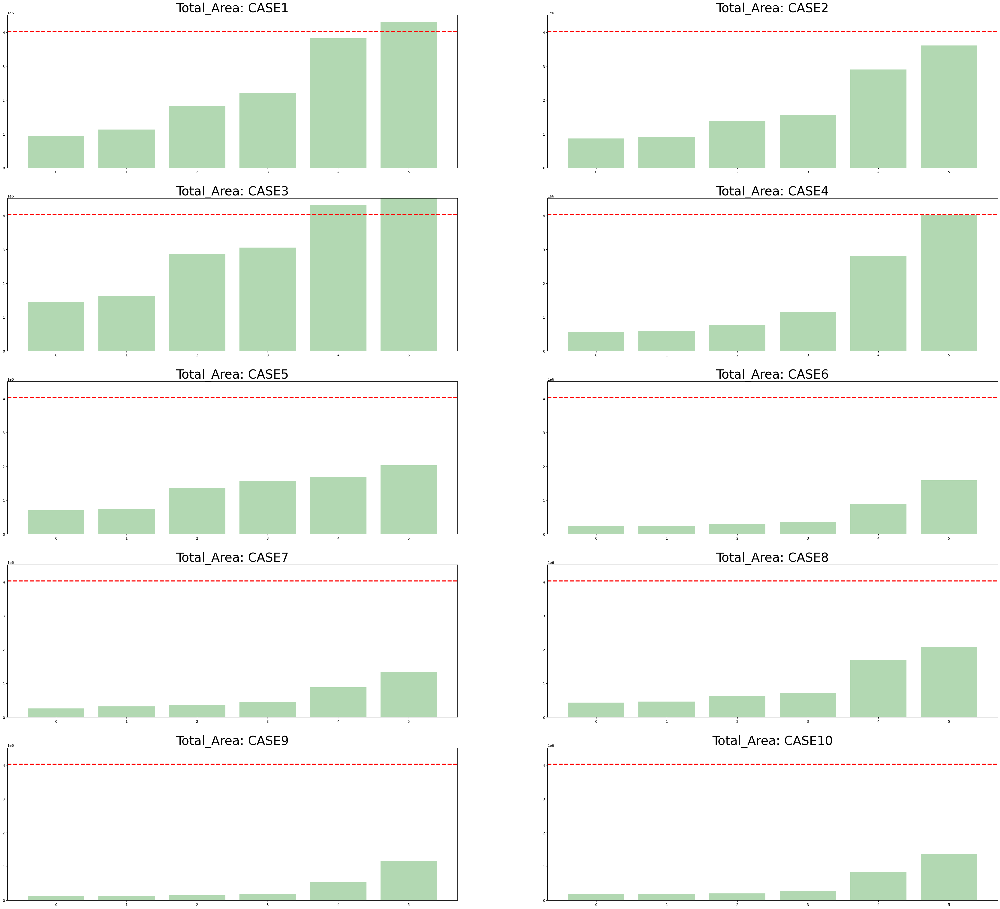

In [ ]:
area_q95=df['Total_Area'].quantile(0.95)

f, axes = plt.subplots()
f.set_size_inches((50,45))


for i in range(len(dfs_area)):
    dfv=dfs_area[i]
    x=np.arange(len(dfv['Total_Area']))
    plt.subplot(5,2,i+1)
    plt.bar(x,dfv['Total_Area'], color='green',linewidth=7.0,alpha=0.3)
    plt.title("Total_Area: CASE"+str(i+1),fontsize=35)
    plt.axhline(area_q95, 0, len(dfs_area[i]['Total_Area']), color='red', linestyle='--', linewidth=3)
    plt.ylim([0,max(df['Total_Area'])])

<ipython-input-40-7fa25f8a13d1>:43: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(math.ceil(len(q95_img_list)/3), 3,q95_img_list.index(path)+1)


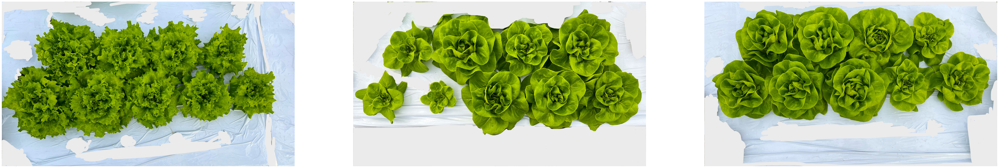

['/content/drive/MyDrive/TEST_DATA/CASE1/image/IMG_3238.jpg', '/content/drive/MyDrive/TEST_DATA/CASE3/image/IMG_2934.jpg', '/content/drive/MyDrive/TEST_DATA/CASE3/image/IMG_3240.jpg']


In [ ]:
# 기준 이상의 면적 데이터프레임 추출
df_area_q95=df[df['Total_Area']>area_q95]
df_area_q95=df_area_q95.sort_values(by=["Total_Area"], ascending=True)
df_area_q95=df_area_q95.head(3)

#이미지 경로 지정
q95_img_list=[]
for i in df_area_q95['case_idx'].unique():
    df_area_q95_split=df_area_q95[df_area_q95['case_idx']==i]

    default_path = "/content/drive/MyDrive/TEST_DATA/CASE"+str(i)+"/" # 경로

    folder_list = os.listdir(default_path)
    #print(folder_list)

    folder=[]
    folder = [file for file in folder_list if file.startswith('image')]
    # print(folder)

    image_path=default_path+folder[0]+"/"

    image_list = sorted(os.listdir(image_path))
   # print(image_list)

    idx_max=df_area_q95_split['img_idx'].max()
    idx_min=df_area_q95_split['img_idx'].min()
    image_list=image_list[int(idx_min):int(idx_max)+1]


    for list_idx in range(len(image_list)):
        image_list[list_idx]=image_path+image_list[list_idx]

    q95_img_list.extend(image_list)

#q95_img_list

#이미지 추출
f, axes = plt.subplots() # f, axes = plt.subplots(math.ceil(len(q95_img_list)/3), 3)
f.set_size_inches(70,40)

for path in q95_img_list:

    plt.subplot(math.ceil(len(q95_img_list)/3), 3,q95_img_list.index(path)+1)
    img = cv.imread(path)
    img=cv.cvtColor(img,cv.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(img)
plt.show()
print(q95_img_list) # 어디에 속한 작물인지 알기 위한 경로를 불러온다.

In [ ]:
print(f"[전체면적] 판단 기준: {area_q95}")

[전체면적] 판단 기준: 4027169.724999999


max except outlier를 기준으로 사용할 때 보다 Quantile 95%를 기준으로 사용할 때 비교적 잘 자란 적상추의 이미지를 가져오는 것을 확인할 수 있습니다.

따라서 Quantile 95% 수치인 5007930.45 이상의 [전체면적]수치를 가진 이미지는 생육수준이 높은 적상추 이미지 임을 알 수 있다